# CS 594 Provenance & Explanations - Project  

The aim of the this Notebook is to do explanation analysis for two gesture recognition models applied to a sensory glove. 

## List of nodes of the skeleton mesh

The sensory glove is creating a skeleton mesh composed of 21 nodes

**Thumb**: tf2 tf3 tf4 tf5

**Index**: tf6 tf7 tf8 tf9

**Major**: tf10 tf11 tf12 tf13

**Ring Finger (RF)**: tf14 tf15 tf16 tf17

**Pinky**: tf18 tf19 tf20 tf21

In [35]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))
import pandas as pd
# import bagpy
# from bagpy import bagreader
import numpy as np
import os
from sklearn.metrics import confusion_matrix, make_scorer, accuracy_score 
import matplotlib as plt
import time
from pyquaternion import Quaternion
import lightgbm as lgb
from sklearn.model_selection import train_test_split

# DataFrame Creation (from bagfile) (don't run this code, it is only used to be able to create the csv file)

In [3]:
def creating_df(folder_path,gesture):
    # Initialize empty list for DataFrames
    dfs = []
    
    # Loop through all files in the folder
    for filename in os.listdir(folder_path):
        # Check if it's a bag file
        if filename.endswith(".bag"):
            
            # Construct full path
            bag_path = os.path.join(folder_path, filename)
            print("processing file: ", bag_path)
    
            # Open the bag file
            b = bagreader(bag_path)
    
            # Load data for each topic
            data_list = []
            for t in b.topics:
                data = b.message_by_topic(t)
                data_list.append(data)
                
            data = pd.read_csv(data_list[0])
            
            # Append the DataFrame to the list
            dfs.append(data)
    
    # Concatenate all DataFrames horizontally (axis=1)
    final_df = pd.concat(dfs, axis=0)
    
    print(dfs[0].shape)
    final_df=final_df.drop(columns=['Time','header.seq','header.stamp.secs','header.stamp.nsecs','header.frame_id','child_frame_id'])

    final_df = final_df.assign(gesture=gesture)

    return final_df

 
rf_folder_path = '/home/phd-leonardo-sitl/Desktop/PhdLeo/dataset_glove/rf_v2'
rf_df = creating_df(rf_folder_path,"ring")

none_folder_path = '/home/phd-leonardo-sitl/Desktop/PhdLeo/dataset_glove/none_v2'
none_df = creating_df(none_folder_path,"none")


clutch_folder_path = '/home/phd-leonardo-sitl/Desktop/PhdLeo/dataset_glove/clutch_v2'
clutch_df = creating_df(clutch_folder_path,"clutch")
 

FileNotFoundError: [WinError 3] The system cannot find the path specified: '/home/phd-leonardo-sitl/Desktop/PhdLeo/dataset_glove/rf_v2'

In [ ]:
def creating_df_test(folder_path,gesture):
    # Initialize empty list for DataFrames
    dfs = []
    
    # Loop through all files in the folder
    for filename in os.listdir(folder_path):
        # Check if it's a bag file
        if filename.endswith(".bag"):
            
            # Construct full path
            bag_path = os.path.join(folder_path, filename)
            print("processing file: ", bag_path)
    
            # Open the bag file
            b = bagreader(bag_path)
    
            # Load data for each topic
            data_list = []
            for t in b.topics:
                data = b.message_by_topic(t)
                data_list.append(data)
                
            data = pd.read_csv(data_list[0])
            
            # Append the DataFrame to the list
            dfs.append(data)
    
    # Concatenate all DataFrames horizontally (axis=1)
    final_df = pd.concat(dfs, axis=0)
    
    print(dfs[0].shape)
    final_df=final_df.drop(columns=['Time','header.seq','header.stamp.secs','header.stamp.nsecs','header.frame_id','child_frame_id'])

    final_df = final_df.assign(gesture=gesture)



    return final_df



rf_folder_path = '/home/phd-leonardo-sitl/Desktop/PhdLeo/dataset_glove/ICRA_2025/hand_recog/gesture_test/rf_test'
rf_df_test = creating_df(rf_folder_path,"ring")

none_folder_path = '/home/phd-leonardo-sitl/Desktop/PhdLeo/dataset_glove/ICRA_2025/hand_recog/gesture_test/none_test'
none_df_test = creating_df(none_folder_path,"none")

clutch_folder_path = '/home/phd-leonardo-sitl/Desktop/PhdLeo/dataset_glove/ICRA_2025/hand_recog/gesture_test/clutch_test'
clutch_df_test = creating_df(clutch_folder_path,"clutch")


processing file:  /home/phd-leonardo-sitl/Desktop/PhdLeo/dataset_glove/ICRA_2025/hand_recog/gesture_test/rf_test/rf_test.bag
[INFO]  Data folder /home/phd-leonardo-sitl/Desktop/PhdLeo/dataset_glove/ICRA_2025/hand_recog/gesture_test/rf_test/rf_test already exists. Not creating.
(1531, 153)
processing file:  /home/phd-leonardo-sitl/Desktop/PhdLeo/dataset_glove/ICRA_2025/hand_recog/gesture_test/none_test/none_test.bag
[INFO]  Data folder /home/phd-leonardo-sitl/Desktop/PhdLeo/dataset_glove/ICRA_2025/hand_recog/gesture_test/none_test/none_test already exists. Not creating.
(2218, 153)
processing file:  /home/phd-leonardo-sitl/Desktop/PhdLeo/dataset_glove/ICRA_2025/hand_recog/gesture_test/clutch_test/clutch_test.bag
[INFO]  Data folder /home/phd-leonardo-sitl/Desktop/PhdLeo/dataset_glove/ICRA_2025/hand_recog/gesture_test/clutch_test/clutch_test already exists. Not creating.
(1763, 153)


In [9]:
df = pd.concat([rf_df, clutch_df,none_df], axis=0) #HERE TO ADD IF YOU HAVE NEW ONES
df = df.drop(columns=[col for col in df.columns if 'translation' in col]) #TO WORK ONLY WITH QUAT
df.to_csv("/home/phd-leonardo-sitl/Desktop/PhdLeo/dataset_glove/df_train.csv", index=False)


df_test = pd.concat([rf_df_test, clutch_df_test,none_df_test], axis=0) #HERE TO ADD IF YOU HAVE NEW ONES
df_test_pred = df_test.drop(columns=[col for col in df.columns if 'translation' in col]) 

df.columns = [col.replace('transform', 'tf').replace('.rotation', '') for col in df.columns] #renaming for clarity
df_test_pred.columns = [col.replace('transform', 'tf').replace('.rotation', '') for col in df_test_pred.columns] #renaming for clarity

print(df.head())

df.columns = [col.replace('transform', 'tf').replace('.rotation', '') for col in df.columns]
df_test_pred.columns = [col.replace('transform', 'tf').replace('.rotation', '') for col in df_test_pred.columns] #renaming for clarity

df_test_explanation = df_test_pred.drop("gesture", axis=1)

df.to_csv("/home/phd-leonardo-sitl/Desktop/PhdLeo/dataset_glove/df_train.csv", index=False)
df_test_explanation.to_csv("/home/phd-leonardo-sitl/Desktop/PhdLeo/dataset_glove/df_test.csv", index=False)



      tf1.x     tf1.y     tf1.z     tf1.w     tf2.x     tf2.y     tf2.z  \
0 -0.410092  0.399023  0.715128 -0.401494  0.805222  0.170263 -0.415081   
1 -0.411118  0.391223  0.713599 -0.410736  0.801753  0.182860 -0.414925   
2 -0.415792  0.377898  0.714053 -0.417658  0.801028  0.192184 -0.413658   
3 -0.421070  0.364106  0.721209 -0.412293  0.805010  0.209610 -0.413853   
4 -0.433288  0.334360  0.744181 -0.382962  0.823101  0.220595 -0.409515   

      tf2.w     tf3.x     tf3.y  ...    tf19.w    tf20.x    tf20.y    tf20.z  \
0  0.387732  0.905911  0.329102  ...  0.269588  0.038361 -0.261171 -0.477021   
1  0.389349  0.902755  0.340818  ...  0.263862  0.041371 -0.255895 -0.466772   
2  0.387694  0.901530  0.348265  ...  0.259632  0.047994 -0.251884 -0.458546   
3  0.369795  0.905160  0.355572  ...  0.244354  0.064026 -0.236752 -0.460970   
4  0.325794  0.919262  0.345208  ...  0.240144  0.092150 -0.232867 -0.484191   

     tf20.w    tf21.x    tf21.y    tf21.z    tf21.w  gesture  
0  0.

In [10]:
df.to_csv("/home/phd-leonardo-sitl/Desktop/PhdLeo/dataset_glove/df_train.csv", index=False)
df_test_explanation.to_csv("/home/phd-leonardo-sitl/Desktop/PhdLeo/dataset_glove/df_test.csv", index=False)

# Loading df

In [39]:
# Load the saved CSV files
df = pd.read_csv("./df_train.csv")
df_test_explanation = pd.read_csv("./df_test.csv")


In [40]:
df_test_explanation.head()

,tf1.translation.x,tf1.translation.y,tf1.translation.z,tf1.x,tf1.y,tf1.z,tf1.w,tf2.translation.x,tf2.translation.y,tf2.translation.z,...,tf20.y,tf20.z,tf20.w,tf21.translation.x,tf21.translation.y,tf21.translation.z,tf21.x,tf21.y,tf21.z,tf21.w
0,0.0,0.0,0.0,-0.645453,0.219489,0.729092,0.060335,-0.073615,0.014109,-0.060651,...,0.295372,0.644804,-0.544774,-0.179519,0.073202,0.100730,-0.446709,0.296480,0.643451,-0.546371
1,0.0,0.0,0.0,-0.647814,0.219402,0.726878,0.062037,-0.073162,0.014292,-0.061153,...,0.297902,0.644340,-0.542816,-0.180067,0.073520,0.099588,-0.448072,0.299013,0.642992,-0.544411
2,0.0,0.0,0.0,-0.648550,0.219108,0.726281,0.062370,-0.073040,0.014312,-0.061294,...,0.296672,0.645819,-0.542670,-0.180034,0.073503,0.099700,-0.446938,0.297781,0.644472,-0.544269
3,0.0,0.0,0.0,-0.648550,0.219108,0.726281,0.062370,-0.073040,0.014312,-0.061294,...,0.297381,0.646320,-0.542413,-0.180018,0.073611,0.099725,-0.446053,0.298487,0.644974,-0.544014
4,0.0,0.0,0.0,-0.650331,0.218318,0.724929,0.062339,-0.072792,0.014207,-0.061613,...,0.300577,0.646270,-0.541289,-0.180510,0.073761,0.098969,-0.445342,0.301682,0.644926,-0.542890


In [41]:


# Mapping of tfX to new labels
mapping = {
    1: "Wrist",
    2: "Thumb1", 3: "Thumb2", 4: "Thumb3", 5: "Thumb4",
    6: "Index1", 7: "Index2", 8: "Index3", 9: "Index4",
    10: "Major1", 11: "Major2", 12: "Major3", 13: "Major4",
    14: "RingFinger1", 15: "RingFinger2", 16: "RingFinger3", 17: "RingFinger4",
    18: "Pinky1", 19: "Pinky2", 20: "Pinky3", 21: "Pinky4"
}

# Replace tfX with the mapped values
def rename_column(col):
    if 'tf' in col:
        num = int(col.split('.')[0][2:])  # Extract the number from tfX
        if num in mapping:
            return col.replace(f"tf{num}", mapping[num])
    return col

df_test_explanation.columns = [rename_column(col) for col in df_test_explanation.columns]
df.columns = [rename_column(col) for col in df.columns]




In [42]:
# Display the updated DataFrame
df_test_explanation.head()

,Wrist.translation.x,Wrist.translation.y,Wrist.translation.z,Wrist.x,Wrist.y,Wrist.z,Wrist.w,Thumb1.translation.x,Thumb1.translation.y,Thumb1.translation.z,...,Pinky3.y,Pinky3.z,Pinky3.w,Pinky4.translation.x,Pinky4.translation.y,Pinky4.translation.z,Pinky4.x,Pinky4.y,Pinky4.z,Pinky4.w
0,0.0,0.0,0.0,-0.645453,0.219489,0.729092,0.060335,-0.073615,0.014109,-0.060651,...,0.295372,0.644804,-0.544774,-0.179519,0.073202,0.100730,-0.446709,0.296480,0.643451,-0.546371
1,0.0,0.0,0.0,-0.647814,0.219402,0.726878,0.062037,-0.073162,0.014292,-0.061153,...,0.297902,0.644340,-0.542816,-0.180067,0.073520,0.099588,-0.448072,0.299013,0.642992,-0.544411
2,0.0,0.0,0.0,-0.648550,0.219108,0.726281,0.062370,-0.073040,0.014312,-0.061294,...,0.296672,0.645819,-0.542670,-0.180034,0.073503,0.099700,-0.446938,0.297781,0.644472,-0.544269
3,0.0,0.0,0.0,-0.648550,0.219108,0.726281,0.062370,-0.073040,0.014312,-0.061294,...,0.297381,0.646320,-0.542413,-0.180018,0.073611,0.099725,-0.446053,0.298487,0.644974,-0.544014
4,0.0,0.0,0.0,-0.650331,0.218318,0.724929,0.062339,-0.072792,0.014207,-0.061613,...,0.300577,0.646270,-0.541289,-0.180510,0.073761,0.098969,-0.445342,0.301682,0.644926,-0.542890


In [43]:
# One-hot encoding
from sklearn.preprocessing import OneHotEncoder

y=df["gesture"].copy()
X=df.drop("gesture", axis=1)

#Creating the dependent variable class
factor = pd.factorize(df["gesture"])
df.gesture = factor[0]
definitions = factor[1]
print(df.gesture)
print(definitions)

0        0
1        0
2        0
3        0
4        0
        ..
60805    2
60806    2
60807    2
60808    2
60809    2
Name: gesture, Length: 60810, dtype: int64
Index(['ring', 'clutch', 'none'], dtype='object')


In [44]:
# Print the quantity of each class
class_counts = df.gesture.value_counts()
print("Quantity of each class:")
print(class_counts)

Quantity of each class:
gesture
2    28217
1    17036
0    15557
Name: count, dtype: int64


In [45]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,random_state=42)

print(y_test)


17151    clutch
30644    clutch
53084      none
22536    clutch
8074       ring
          ...  
50240      none
58136      none
3875       ring
13337      ring
7653       ring
Name: gesture, Length: 12162, dtype: object


## Dataset Visualization

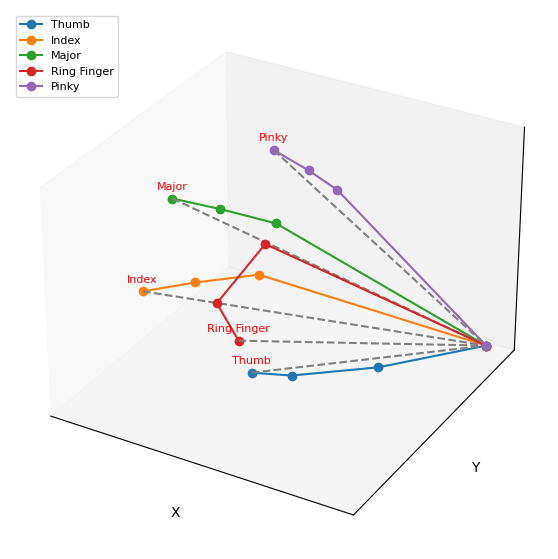

In [46]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import numpy as np
import random
import os 

# Define the folder to save the images
save_folder = "image_classifier"

# Check if the folder exists, if not, create it
if not os.path.exists(save_folder):
    os.makedirs(save_folder)

path = "/home/phd-leonardo-sitl/Desktop/PhdLeo/dataset_glove/predictions/"

# def extracting_pos(df, landmark_positions, index):
#     for i in range(1, 22):
#         landmark_positions.append([df[f"tf{i}.translation.x"].values[index], 
#                                    df[f"tf{i}.translation.y"].values[index],
#                                    df[f"tf{i}.translation.z"].values[index]])

def extracting_pos(df, landmark_positions, index):
    # Mapping of tfX to new labels
    mapping = {
        2: "Thumb1", 3: "Thumb2", 4: "Thumb3", 5: "Thumb4",
        6: "Index1", 7: "Index2", 8: "Index3", 9: "Index4",
        10: "Major1", 11: "Major2", 12: "Major3", 13: "Major4",
        14: "RingFinger1", 15: "RingFinger2", 16: "RingFinger3", 17: "RingFinger4",
        18: "Pinky1", 19: "Pinky2", 20: "Pinky3", 21: "Pinky4"
    }
    
    # Iterate through the mapping keys
    for i in range(2, 22):
        finger_name = mapping[i]
        landmark_positions.append([
            df[f"{finger_name}.translation.x"].values[index],
            df[f"{finger_name}.translation.y"].values[index],
            df[f"{finger_name}.translation.z"].values[index]
        ])

def plotting(landmark_positions, index):
    fig = plt.figure(figsize=(7, 7))
    ax = fig.add_subplot(111, projection="3d")
    
    # Set axis labels
    ax.set_xlabel("X", fontsize=10)
    ax.set_ylabel("Y", fontsize=10)
    ax.set_zlabel("Z", fontsize=10)
    
    # Define finger connections
    fingers = [[0, 1, 2, 3], [0, 5, 6, 7], [0, 9, 10, 11], [0, 13, 14, 15], [0, 17, 18, 19]]
    finger_labels = ["Thumb", "Index", "Major", "Ring Finger", "Pinky"]
    
    for finger, label in zip(fingers, finger_labels):
        # Extract landmarks for the finger
        finger_landmarks = np.array(landmark_positions)[finger]
        
        # Plot the finger skeleton
        ax.plot(finger_landmarks[:, 0], finger_landmarks[:, 1], finger_landmarks[:, 2], marker='o', label=label)
        
        # Label the tip of the finger
        tip = finger_landmarks[-1]
        ax.text(tip[0], tip[1], tip[2]+0.01, f"{label}", fontsize=8, color='red', ha='center', va='center')
        
        # Connect the tip back to the base (landmark 0)
        base = finger_landmarks[0]
        ax.plot([tip[0], base[0]], [tip[1], base[1]], [tip[2], base[2]], linestyle='--', color='gray')
    
    # Turn off axis ticks and grid
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_zticks([])
    ax.grid(False)
    
    # Add legend and title
    ax.legend(loc="upper left", fontsize=8)
    plt.gcf().set_facecolor('white')
    plt.pause(0.001)  # Pause for visualization


# Get the total number of samples
total_samples = len(df_test_explanation)


index = 500
landmark_positions = []
extracting_pos(df_test_explanation, landmark_positions, index)
plotting(landmark_positions, index)
plt.show()  # Display the plot before saving


We can here visualize the nodes composing the skeleton hand. It is important to note that the only data we have access is the relative pose to a virtual base defined at the starting of the glove

# Random Forest



Random Forest is the first model trained, the hyper parameters have been selected using a GridSearch (3 differents values for each parameter and a cv of 5)

In [47]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, f1_score, recall_score
import joblib

classifier = RandomForestClassifier(n_estimators = 20, max_depth=10,criterion = 'gini', random_state = 42,
                                   min_samples_leaf= 1, min_samples_split= 10,)
classifier.fit(X_train, y_train)

# Save the classifier to a file
joblib.dump(classifier, 'gesture_recog_model_r.joblib')

# Make predictions on the testing set
y_pred_rf = classifier.predict(X_test)


# Evaluate the model
rf_acc = accuracy_score(y_test, y_pred_rf)


rf_f1 = f1_score(y_test, y_pred_rf, average='weighted')
rf_rec = recall_score(y_test, y_pred_rf, average='weighted')

print("Accuracy",rf_acc,"F1 score", rf_f1,"Recall", rf_rec)

Accuracy 0.9685084690018089 F1 score 0.968394081318743 Recall 0.9685084690018089


In [48]:
y_pred_rf

array(['clutch', 'clutch', 'none', ..., 'ring', 'ring', 'ring'],
      dtype=object)

Even though the model present high accuracy, F1 score,  and Recall  when used in a real case scenario the gesture recognition will not adapt to different size of hands and different posture of the user

## FEATURE IMPORTANCE


### Shap

In [36]:
import shap
import matplotlib.pyplot as plt

# load JS visualization code to notebook
shap.initjs()

# Create the explainer
explainer = shap.TreeExplainer(classifier)

shap_values = explainer.shap_values(X_test)

In [37]:
shap_values[:,:,0].shape

(12162, 84)

In [38]:
X_test.shape

(12162, 84)


### List of nodes of the skeleton mesh


**Thumb**: tf2 tf3 tf4 tf5

**Index**: tf6 tf7 tf8 tf9

**Major**: tf10 tf11 tf12 tf13

**Ring Finger (RF)**: tf14 tf15 tf16 tf17

**Pinky**: tf18 tf19 tf20 tf21


Below is the SHAP feature importance for hand recognition. The results are consistent; we can see that for the RF gesture (second plot), the decision was made by looking  at the major and Ring Finger, followed by the other fingers. In contrast, for the clutch gesture, a broader analysis of the fingers is performed, as executing a clutch requires closing the RF, major, and pinky fingers. The None class will more do a complementary analysis.

Variable Importance Plot - Global Interpretation


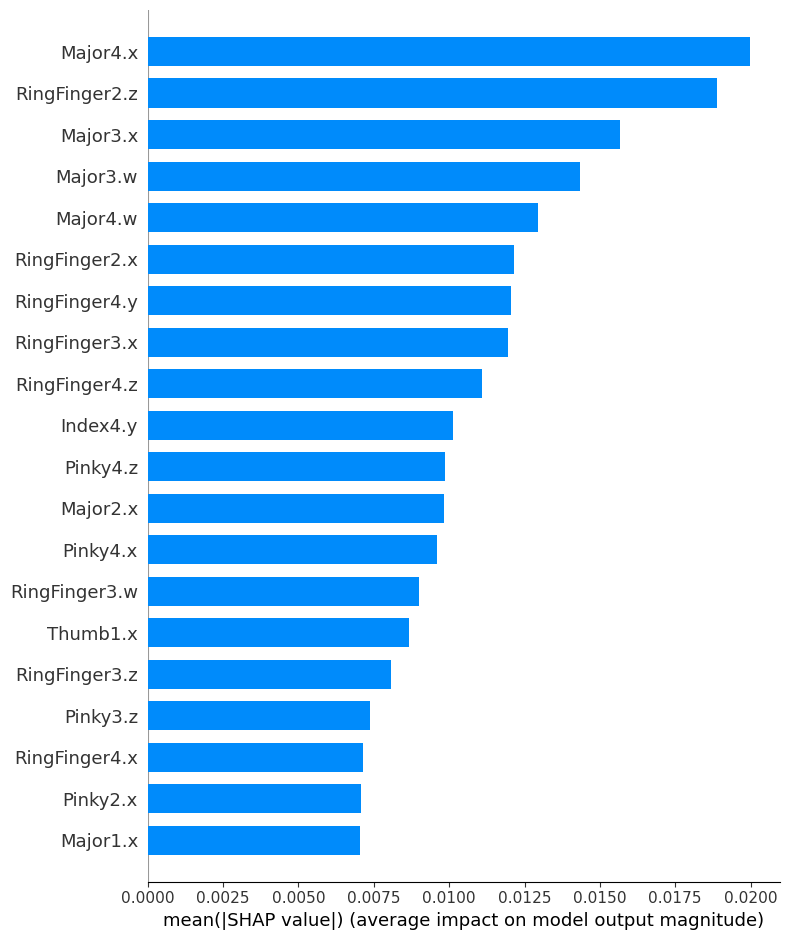

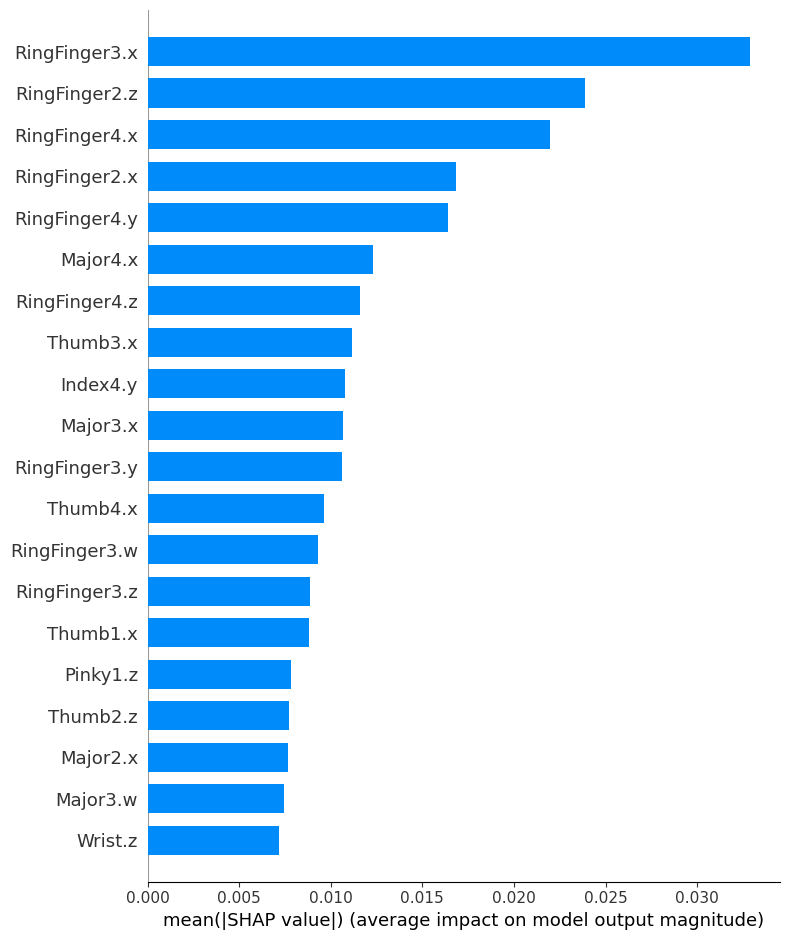

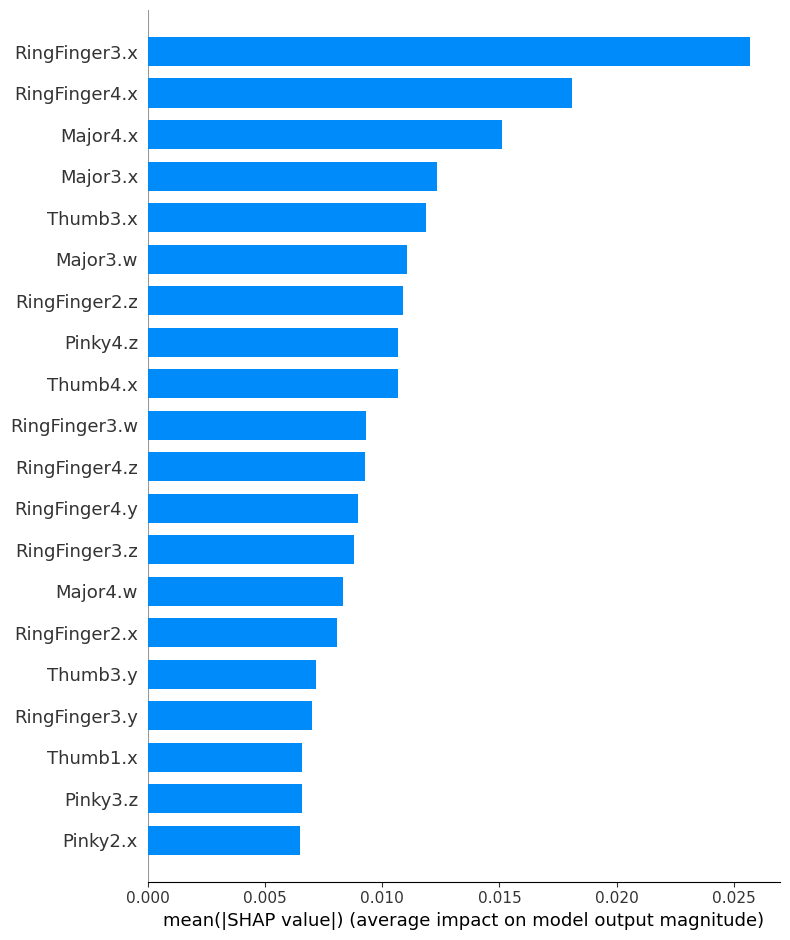

In [39]:
print("Variable Importance Plot - Global Interpretation")
figure = plt.figure()
shap.summary_plot(shap_values[:,:,0], X_test, plot_type="bar")
shap.summary_plot(shap_values[:,:,1], X_test, plot_type="bar")
shap.summary_plot(shap_values[:,:,2], X_test, plot_type="bar")


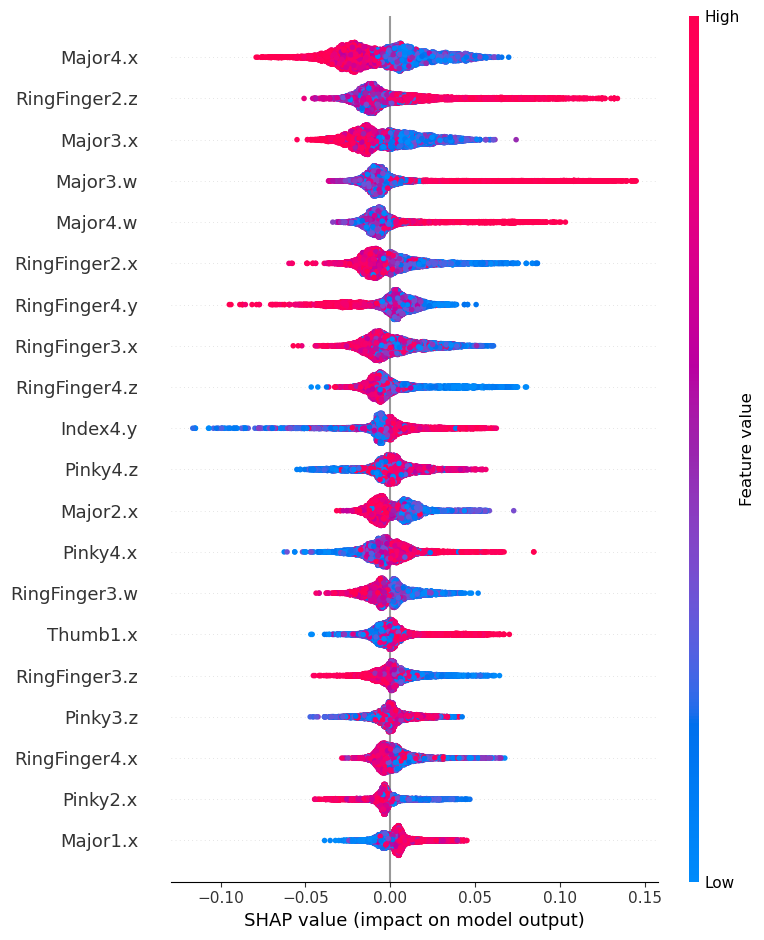

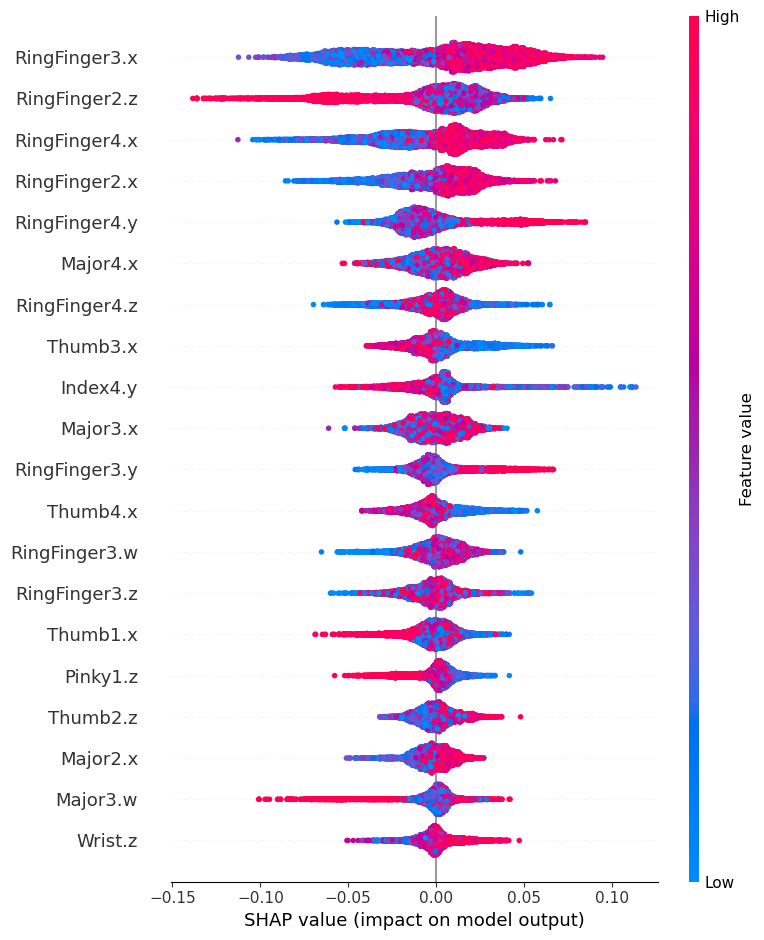

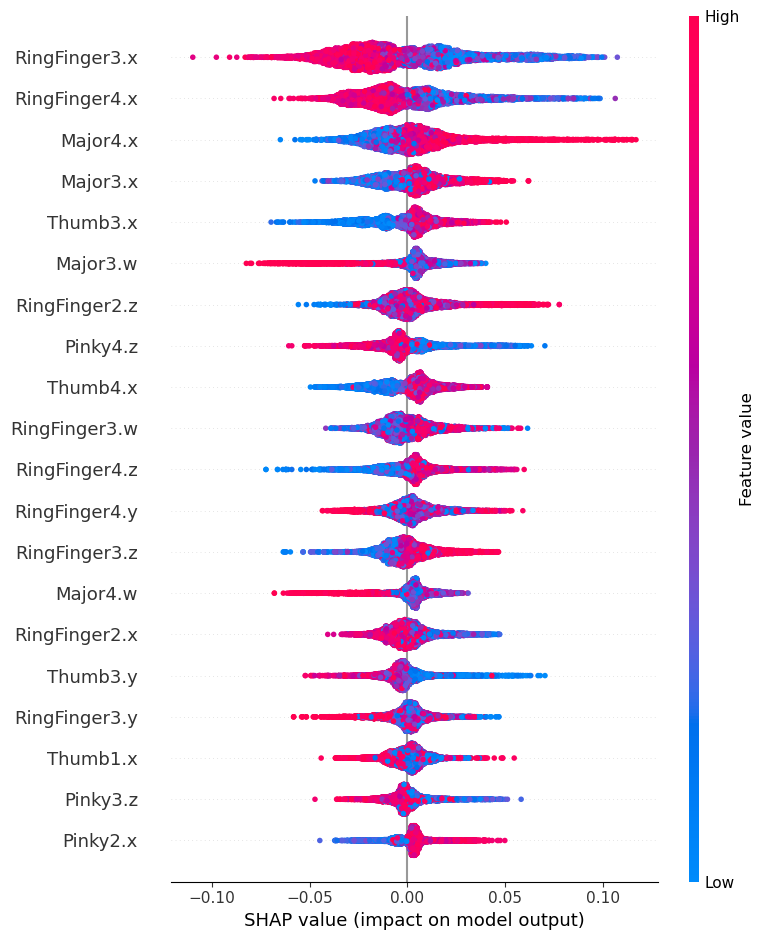

In [40]:
shap.summary_plot(shap_values[:,:,0], X_test)
shap.summary_plot(shap_values[:,:,1], X_test)
shap.summary_plot(shap_values[:,:,2], X_test)

The Following Graph allows us to appreciate the positive and negative classes

## Lime

In [41]:
# Import the LimeTabularExplainer module
from lime.lime_tabular import LimeTabularExplainer

X_train_np = X_train.to_numpy()  

feature_names = X_train.columns.tolist()  


explainer = LimeTabularExplainer(X_train_np, 
                                 feature_names=feature_names, 
                                 class_names=['ring', 'clutch', 'none'], 
                                 mode='classification')



In [42]:
# instance = np.array(X_train)
instance = X_train_np
instance_idx = index




In [43]:
df_test_explanation.head()

,Wrist.translation.x,Wrist.translation.y,Wrist.translation.z,Wrist.x,Wrist.y,Wrist.z,Wrist.w,Thumb1.translation.x,Thumb1.translation.y,Thumb1.translation.z,...,Pinky3.y,Pinky3.z,Pinky3.w,Pinky4.translation.x,Pinky4.translation.y,Pinky4.translation.z,Pinky4.x,Pinky4.y,Pinky4.z,Pinky4.w
0,0.0,0.0,0.0,-0.645453,0.219489,0.729092,0.060335,-0.073615,0.014109,-0.060651,...,0.295372,0.644804,-0.544774,-0.179519,0.073202,0.100730,-0.446709,0.296480,0.643451,-0.546371
1,0.0,0.0,0.0,-0.647814,0.219402,0.726878,0.062037,-0.073162,0.014292,-0.061153,...,0.297902,0.644340,-0.542816,-0.180067,0.073520,0.099588,-0.448072,0.299013,0.642992,-0.544411
2,0.0,0.0,0.0,-0.648550,0.219108,0.726281,0.062370,-0.073040,0.014312,-0.061294,...,0.296672,0.645819,-0.542670,-0.180034,0.073503,0.099700,-0.446938,0.297781,0.644472,-0.544269
3,0.0,0.0,0.0,-0.648550,0.219108,0.726281,0.062370,-0.073040,0.014312,-0.061294,...,0.297381,0.646320,-0.542413,-0.180018,0.073611,0.099725,-0.446053,0.298487,0.644974,-0.544014
4,0.0,0.0,0.0,-0.650331,0.218318,0.724929,0.062339,-0.072792,0.014207,-0.061613,...,0.300577,0.646270,-0.541289,-0.180510,0.073761,0.098969,-0.445342,0.301682,0.644926,-0.542890


In [44]:
exp = explainer.explain_instance(instance[instance_idx], classifier.predict_proba, num_features=5, top_labels=3)#num_samples = 11)

C:\Users\Leonardo\anaconda3\envs\provenance\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


In [45]:
exp.show_in_notebook()

In the case of Lime we can see that the huge size of the dataset firstly cause a inssue in a correct visualization, also the result is less consistant that in the Sharp model. Here below we will try to train the model with a much less size of training data to see the difference, we do a randomsapling of the original data by using the sklearn train_test_split functionality (first to define a training size of 10% of the original and the to split it in train teest sets)

In [46]:
classifier = RandomForestClassifier(n_estimators = 20, max_depth=10,criterion = 'gini', random_state = 42,
                                   min_samples_leaf= 1, min_samples_split= 10,)

###########SELECTING A MUCH SMALLER DATASET SIZE###########

X_combined = pd.concat([X_train, X_test])
y_combined = pd.concat([y_train, y_test])

# Random Sampling 10% of the data
X_sampled, _, y_sampled, _ = train_test_split(
    X_combined, y_combined, test_size=0.9, stratify=y_combined, random_state=42
)

# Split the sampled data back into training and testing sets
X_train_sampled, X_test_sampled, y_train_sampled, y_test_sampled = train_test_split(
    X_sampled, y_sampled, test_size=0.2, stratify=y_sampled, random_state=42
)


classifier.fit(X_train_sampled, y_train_sampled)

# Save the classifier to a file
joblib.dump(classifier, 'gesture_recog_model_r.joblib')

# Make predictions on the testing set
y_pred_rf = classifier.predict(X_test_sampled)


# Evaluate the model
rf_acc = accuracy_score(y_test_sampled, y_pred_rf)


rf_f1 = f1_score(y_test_sampled, y_pred_rf, average='weighted')
rf_rec = recall_score(y_test_sampled, y_pred_rf, average='weighted')

print("Accuracy",rf_acc,"F1 score", rf_f1,"Recall", rf_rec)

Accuracy 0.9252259654889071 F1 score 0.9249972018573752 Recall 0.9252259654889071


In [47]:
# Import the LimeTabularExplainer module
from lime.lime_tabular import LimeTabularExplainer

X_train_np = X_train_sampled.to_numpy()  

feature_names = X_train_sampled.columns.tolist()  


explainer = LimeTabularExplainer(X_train_np, 
                                 feature_names=feature_names, 
                                 class_names=['ring', 'clutch', 'none'], 
                                 mode='classification')

# instance = np.array(X_train)
instance = X_train_np
instance_idx = index



exp = explainer.explain_instance(instance[instance_idx], classifier.predict_proba, num_features=5, top_labels=3)#num_samples = 11)


C:\Users\Leonardo\anaconda3\envs\provenance\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


In [48]:
exp.show_in_notebook()

We can see now a much more coherent results, as the first 4 more influencing features are from the RingFinger.

# LGBM

The second model is is the LGBM, currently used in the project. Still some poses were causing issues and flickering in the prediction.

In [49]:
# Define the parameter grid
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, f1_score, recall_score
import joblib

classifier_lgbm = lgb.LGBMClassifier(device_type='gpu', gpu_device_id=0, verbose = 0, max_depth=4, min_child_samples=20)

classifier_lgbm.fit(X_train,y_train)
# Make predictions on the testing set
y_pred_lgbm = classifier_lgbm.predict(X_test)

# Evaluate the model
lgbm_acc = accuracy_score(y_test, y_pred_lgbm)
lgbm_f1 = f1_score(y_test, y_pred_lgbm, average='weighted')
lgbm_rec = recall_score(y_test, y_pred_lgbm, average='weighted')

print(f"Accuracy: {lgbm_acc:.4f}")
print(f"F1 Score: {lgbm_f1:.4f}")
print(f"Recall: {lgbm_rec:.4f}")

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

## FEATURE IMPORTANCE

### Shap

In [50]:
import shap
import matplotlib.pyplot as plt

# load JS visualization code to notebook
shap.initjs()

# Create the explainer
explainer = shap.TreeExplainer(classifier_lgbm)

shap_values = explainer.shap_values(X_test)

## List of nodes of the skeleton mesh

**Wrist**: tf1

**Thumb**: tf2 tf3 tf4 tf5

**Index**: tf6 tf7 tf8 tf9

**Major**: tf10 tf11 tf12 tf13

**Ring Finger (RF)**: tf14 tf15 tf16 tf17

**Pinky**: tf18 tf19 tf20 tf21

Variable Importance Plot - Global Interpretation


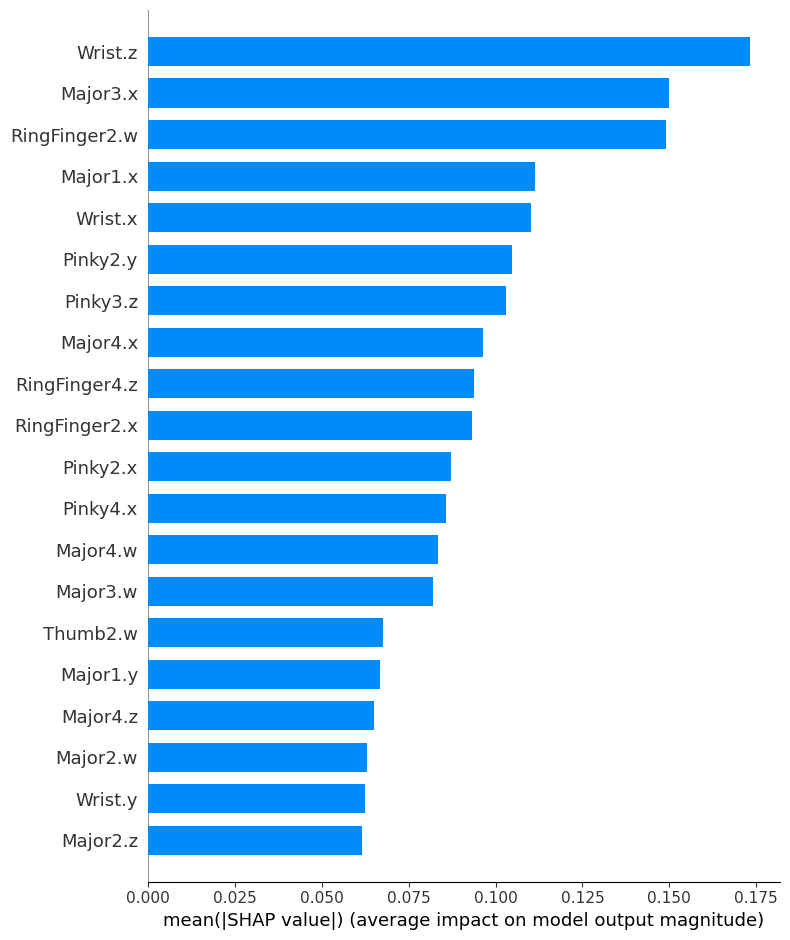

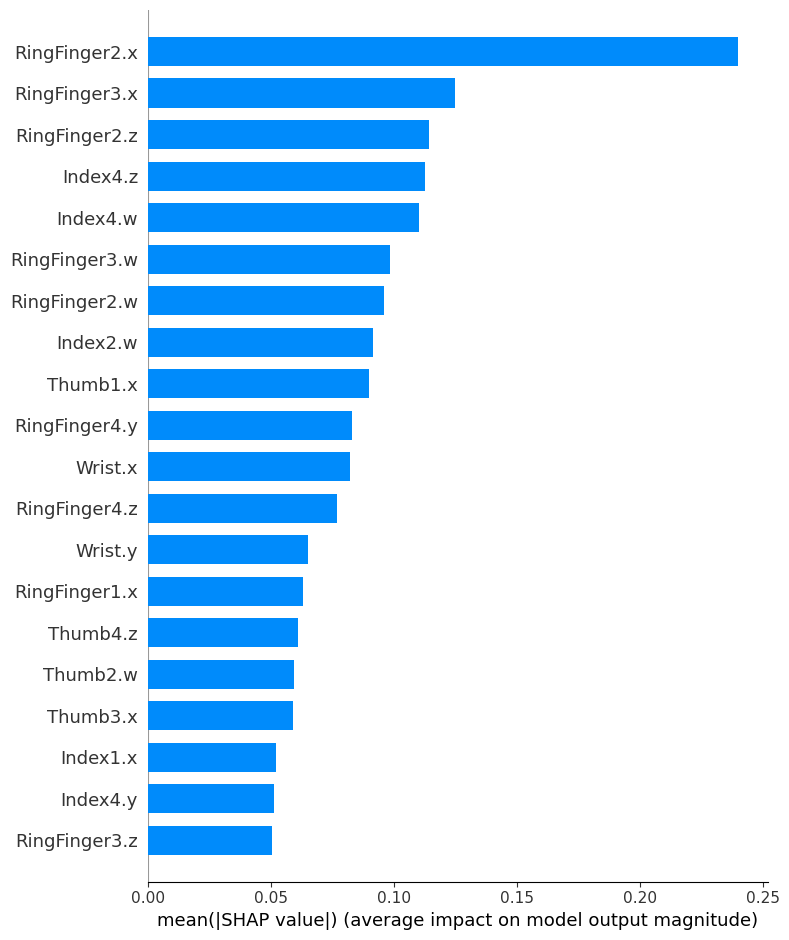

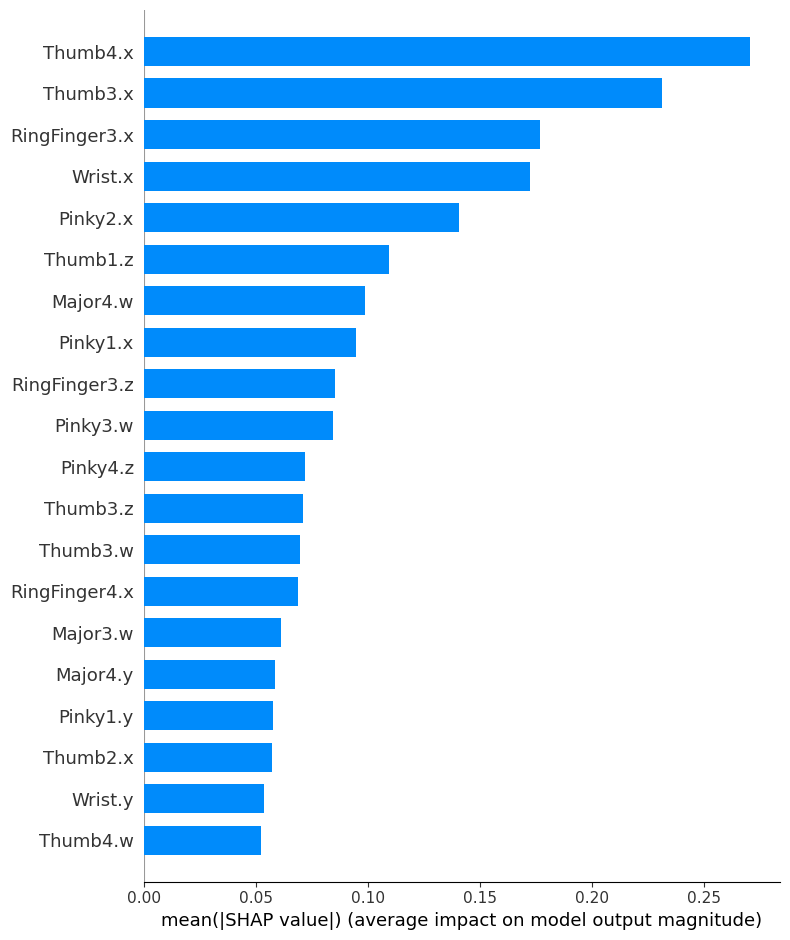

In [51]:
print("Variable Importance Plot - Global Interpretation")
figure = plt.figure()
shap.summary_plot(shap_values[:,:,0], X_test, plot_type="bar")
shap.summary_plot(shap_values[:,:,1], X_test, plot_type="bar")
shap.summary_plot(shap_values[:,:,2], X_test, plot_type="bar")

We can see that in this model the wrist has a major role in the prediction. Which is exactly why this model is much more stable: while the user shift his hand poses cosidering only the ring finger itself may result in a wrong prediction (we remind that every pose is given as a relative transformation to virtual base set at the begginning). This also shows why the RF model was unstable, however this also show the limit the limit of the current model.

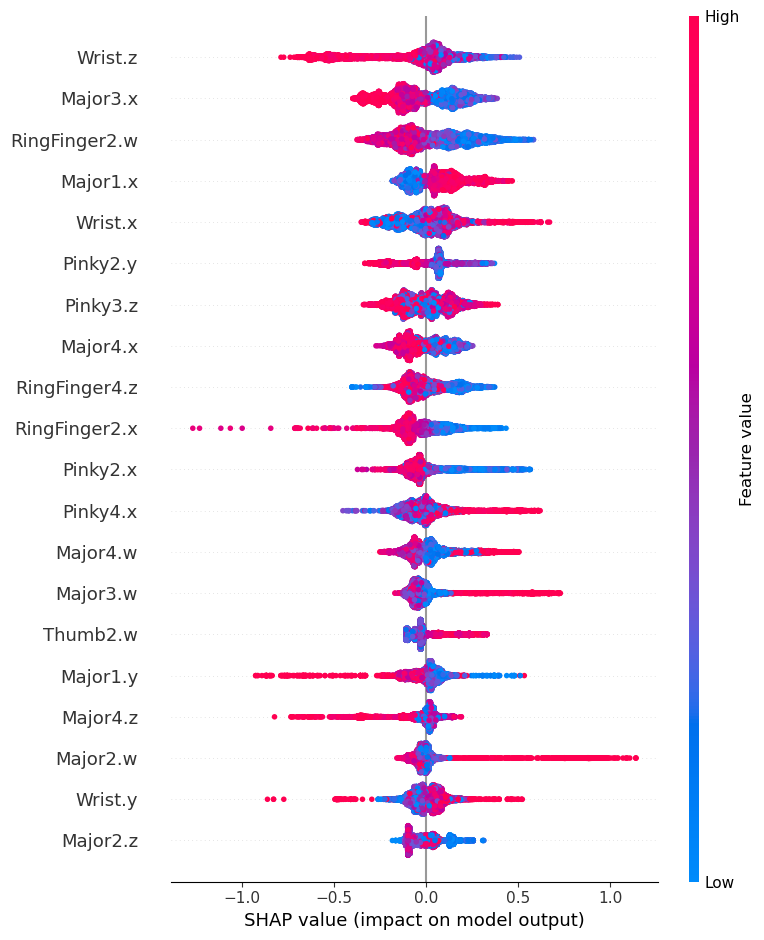

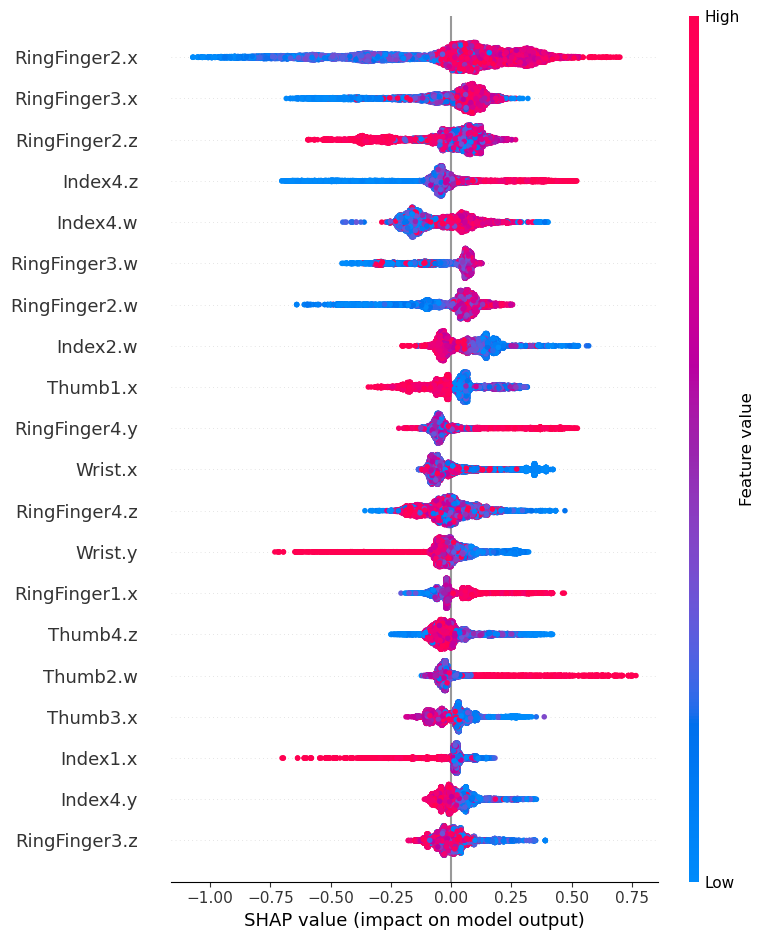

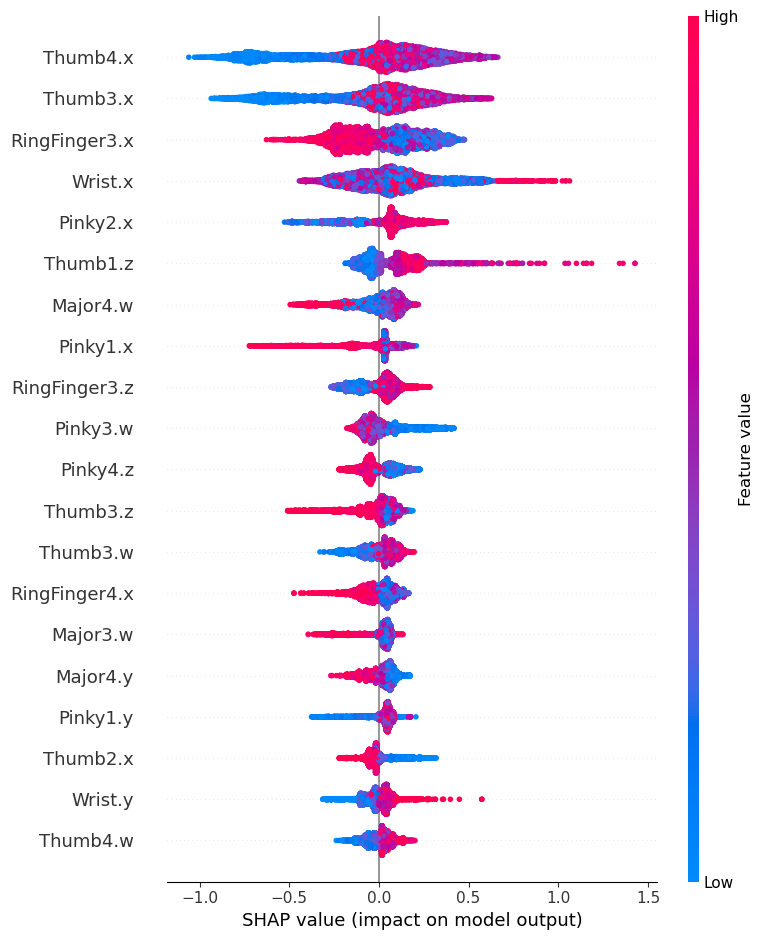

In [52]:
shap.summary_plot(shap_values[:,:,0], X_test)
shap.summary_plot(shap_values[:,:,1], X_test)
shap.summary_plot(shap_values[:,:,2], X_test)

## Lime

In [53]:
# Import the LimeTabularExplainer module
from lime.lime_tabular import LimeTabularExplainer

# Get the class names
class_names = ['ring', 'clutch', 'none']

# Get the feature names
feature_names = list(X_train.columns)


explainer = LimeTabularExplainer(np.array(X_train), feature_names = feature_names,class_names = class_names)



In [54]:
instance = np.array(X_train)
instance_idx = 1000

In [55]:
exp = explainer.explain_instance(instance[instance_idx], classifier_lgbm.predict_proba, num_features=10, top_labels=3)

In [56]:
exp.show_in_notebook()

Here also as before the lime model different from the shap

In [58]:
#X_train_sampled, X_test_sampled, y_train_sampled, y_test_sampled from before
# Define the parameter grid
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, f1_score, recall_score
import joblib

classifier_lgbm = lgb.LGBMClassifier(device_type='gpu', gpu_device_id=0, verbose = 0, max_depth=4, min_child_samples=20)

classifier_lgbm.fit(X_train_sampled,y_train_sampled)
# Make predictions on the testing set
y_pred_lgbm = classifier_lgbm.predict(X_test_sampled)

# Evaluate the model
lgbm_acc = accuracy_score(y_test_sampled, y_pred_lgbm)
lgbm_f1 = f1_score(y_test_sampled, y_pred_lgbm, average='weighted')
lgbm_rec = recall_score(y_test_sampled, y_pred_lgbm, average='weighted')

print(f"Accuracy: {lgbm_acc:.4f}")
print(f"F1 Score: {lgbm_f1:.4f}")
print(f"Recall: {lgbm_rec:.4f}")

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [60]:
# Import the LimeTabularExplainer module
from lime.lime_tabular import LimeTabularExplainer

# Get the class names
class_names = ['ring', 'clutch', 'none']

# Get the feature names
feature_names = list(X_train_sampled.columns)


explainer = LimeTabularExplainer(np.array(X_train_sampled), feature_names = feature_names,class_names = class_names)

instance = np.array(X_train_sampled)
instance_idx = 1000
exp = explainer.explain_instance(instance[instance_idx], classifier_lgbm.predict_proba, num_features=10, top_labels=3)

In [61]:
exp.show_in_notebook()

Here again we can see the alignement between the SHAP and LIME decision with the Wrtis.z having 0.85 impact score. As a prof here below we show that the SHAP stayed unchanged even though the dataset is much smaller.

In [62]:
# load JS visualization code to notebook
shap.initjs()

# Create the explainer
explainer = shap.TreeExplainer(classifier_lgbm)

shap_values = explainer.shap_values(X_test)


Variable Importance Plot - Global Interpretation


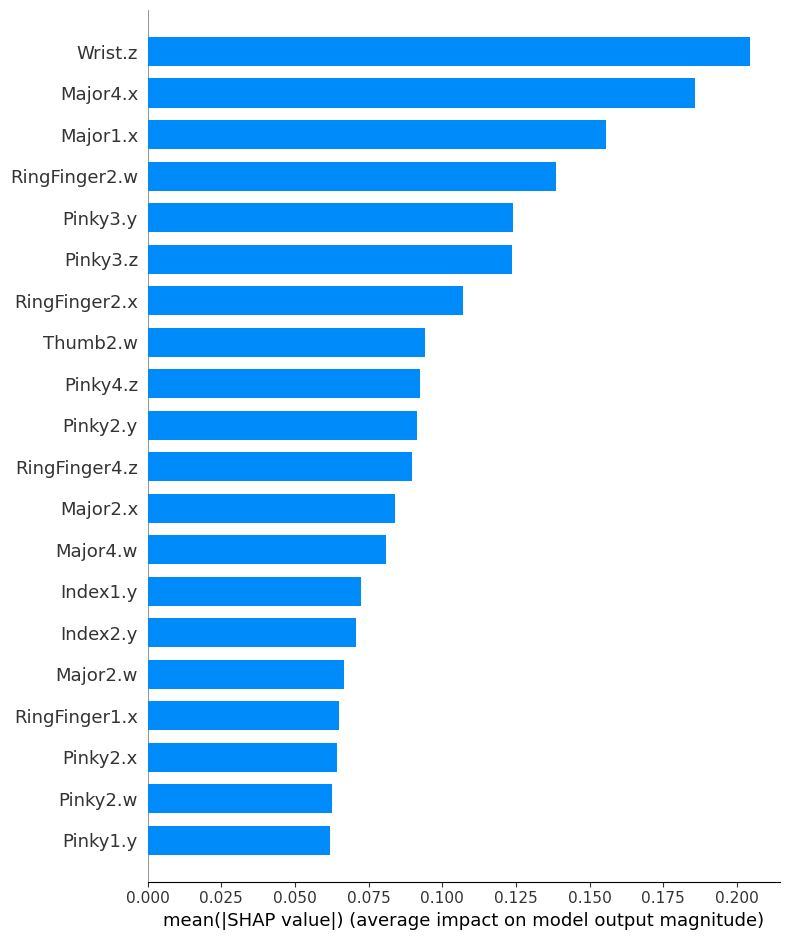

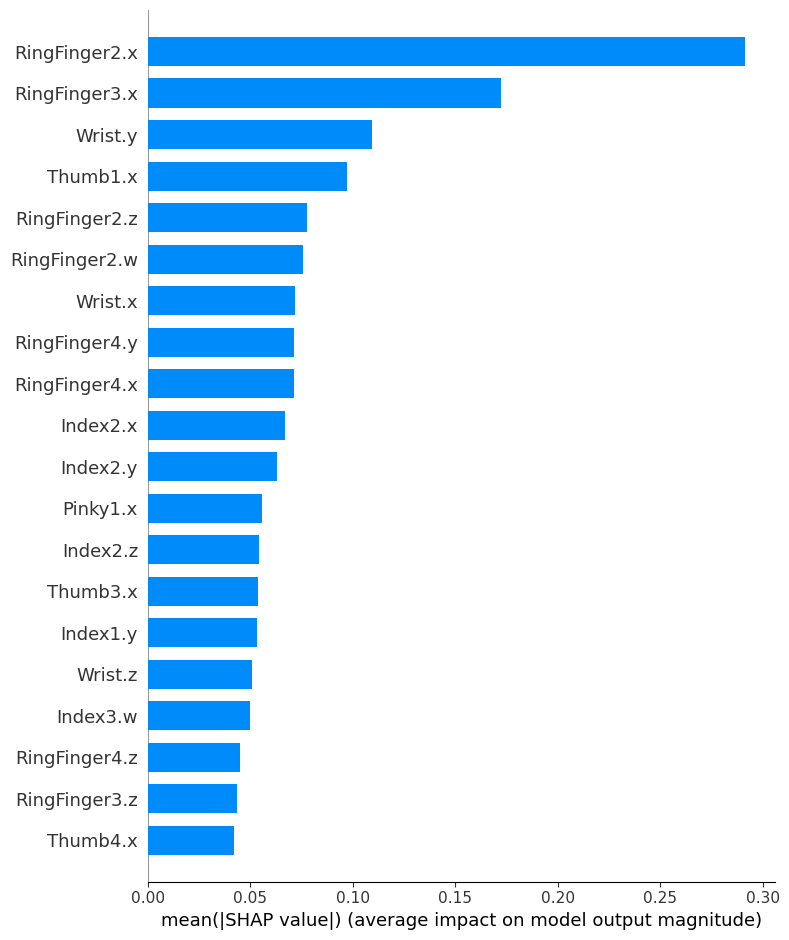

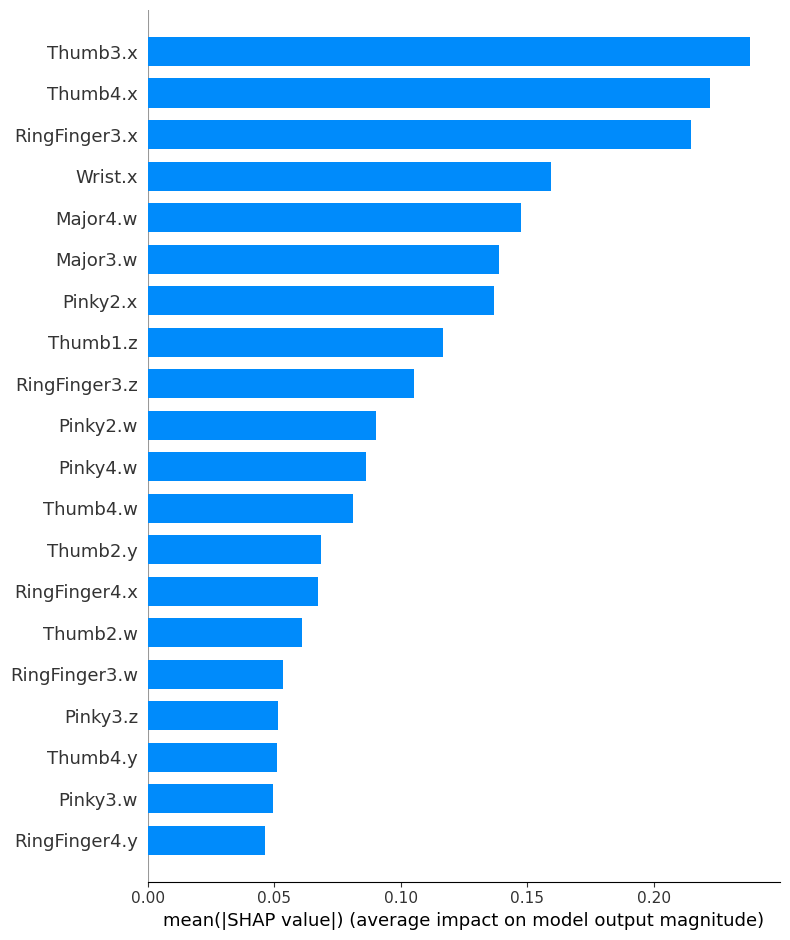

In [63]:
print("Variable Importance Plot - Global Interpretation")
figure = plt.figure()
shap.summary_plot(shap_values[:,:,0], X_test, plot_type="bar")
shap.summary_plot(shap_values[:,:,1], X_test, plot_type="bar")
shap.summary_plot(shap_values[:,:,2], X_test, plot_type="bar")

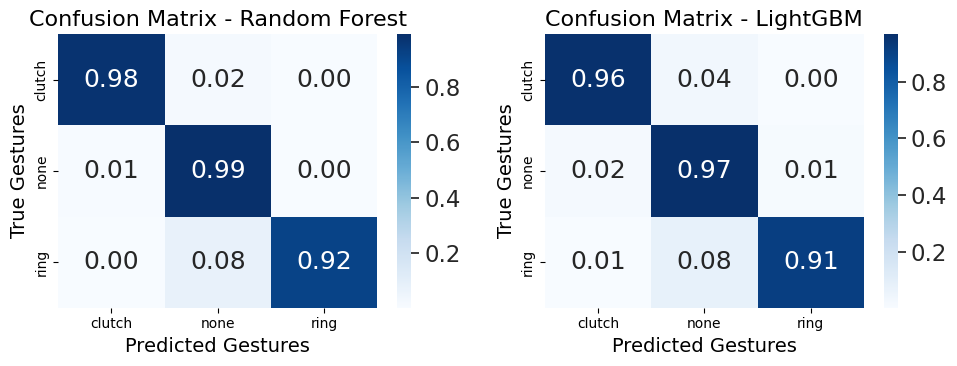

In [35]:
import seaborn as sns
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# List of predicted labels for each model
y_preds = [y_pred_rf, y_pred_lgbm]

# List of model names (for labeling plots)
model_names = ['Random Forest', 'LightGBM']

# Plot the confusion matrices in a 2x2 grid
fig, axes = plt.subplots(1, 2, figsize=(10, 4))
for i, ax in enumerate(axes.flat):
    if i < len(y_preds):
        conf_matrix = confusion_matrix(y_test, y_preds[i])
        # Calculating percentages
        conf_matrix_percent = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis]
        # Converting the confusion matrix to a DataFrame
        conf_matrix = pd.DataFrame(conf_matrix_percent, columns=classifier.classes_, index=classifier.classes_)

        sns.set(font_scale=1.5)  # Adjust the font scale for all elements
        sns.heatmap(conf_matrix, annot=True, cmap='Blues', fmt='.2f', ax=ax)  # Format as percentage with two decimal places
        ax.set_xlabel('Predicted Gestures', fontsize=14)  # Adjust x-axis label font size
        ax.set_ylabel('True Gestures', fontsize=14)  # Adjust y-axis label font size
        ax.set_title(f'Confusion Matrix - {model_names[i]}', fontsize=16)  # Adjust title font size
    else:
        ax.axis('off')  # Turn off empty subplots
plt.tight_layout()

# Save the plot as a PDF file
plt.savefig('confusion_matrices.pdf')


plt.show()


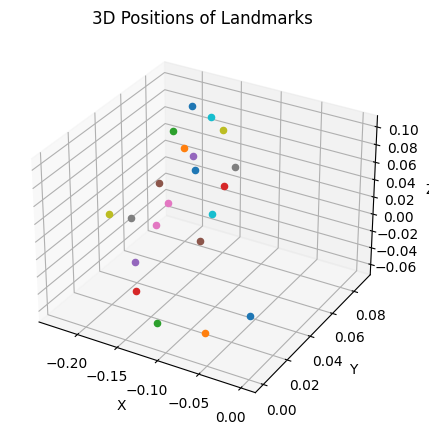

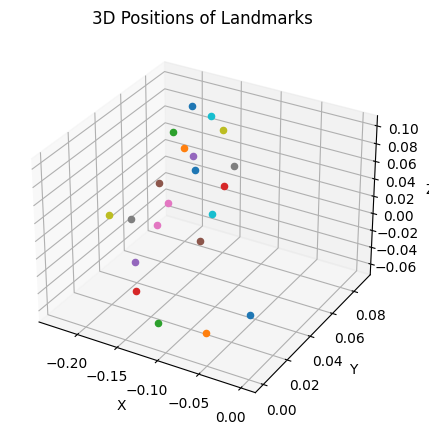

In [39]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib
import matplotlib.pyplot as plt
matplotlib.rc_file_defaults()
path="/home/phd-leonardo-sitl/Desktop/PhdLeo/dataset_glove/predictions/"
def exctracting_pos(df,landmark_positions,index):
    
    for i in range(1, 22):
        landmark_positions.append([df[f"transform{i}.translation.x"].values[index], df[f"transform{i}.translation.y"].values[index],
                                   df[f"transform{i}.translation.z"].values[index]])

def plotting(landmark_positions,index):
    fig = plt.figure(figsize=(5, 5))
    ax = fig.add_subplot(111, projection="3d")
    
    # Set axis labels
    ax.set_xlabel("X")
    ax.set_ylabel("Y")
    ax.set_zlabel("Z")
    
    
    for i, landmark in enumerate(landmark_positions):
        ax.scatter(landmark[0], landmark[1], landmark[2], label=f"Landmark {i+1}")
    
    #y_pred = classifier_lgbm.predict()
    ax.set_title(f"3D Positions of Landmarks") # - Prediction: {y_pred}")
    # Save the figure as a PNG with a unique filename based on i
    #plt.savefig(f"{path}plot_{index}_provenance.png")
    plt.pause(0.001)  # Pause for 2 seconds



for i in range(2):
    
    landmark_positions = []
    exctracting_pos(df_test,landmark_positions,i)
    plotting(landmark_positions,i)



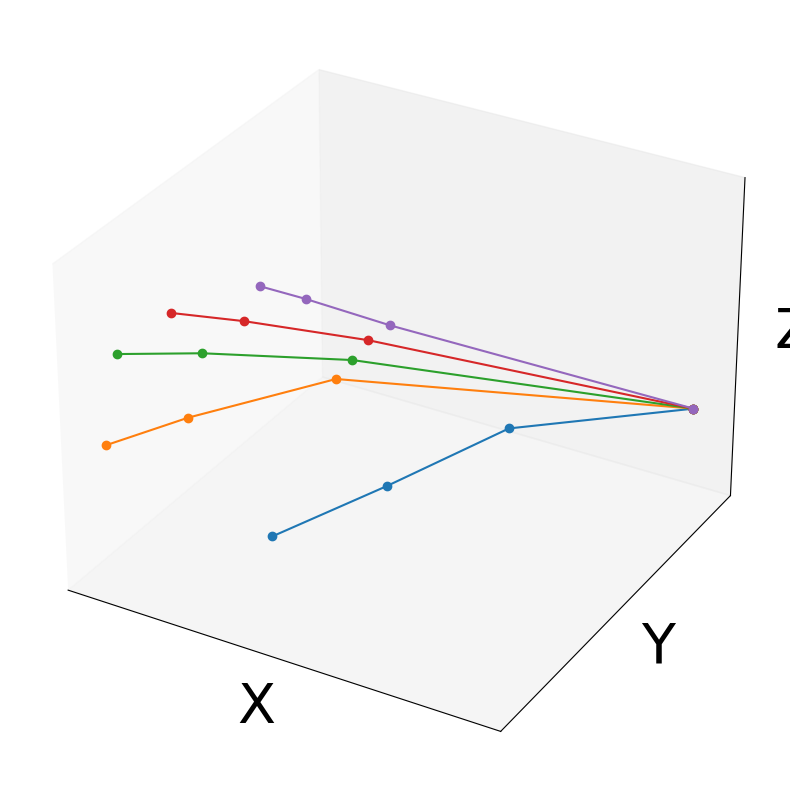

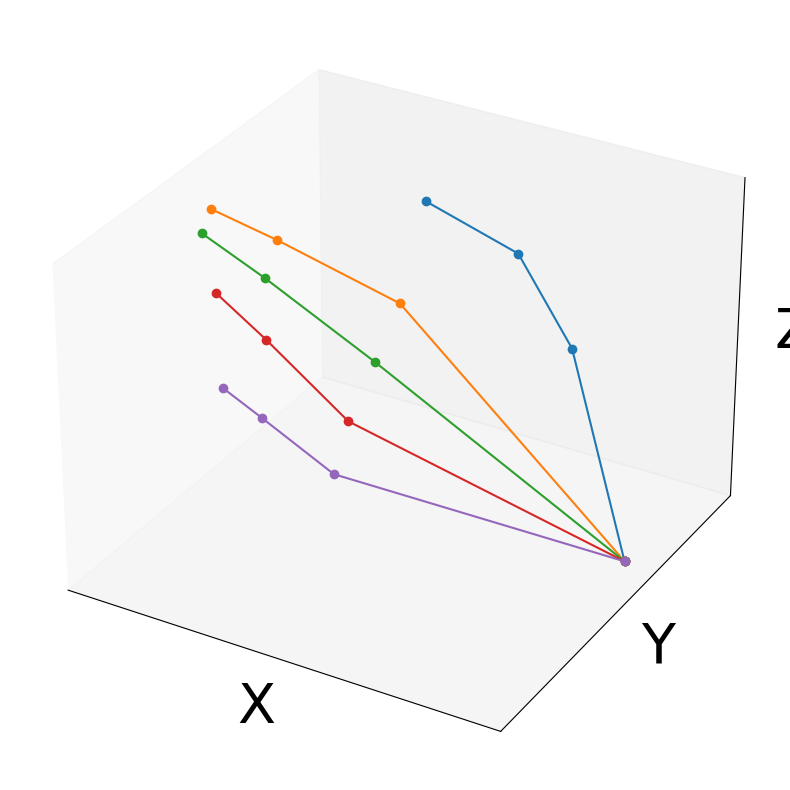

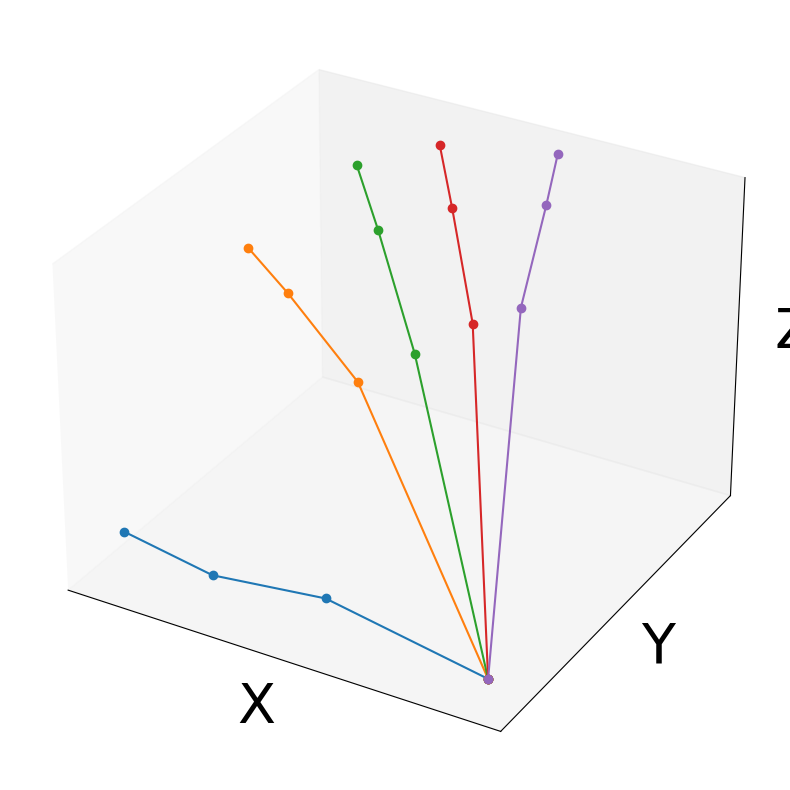

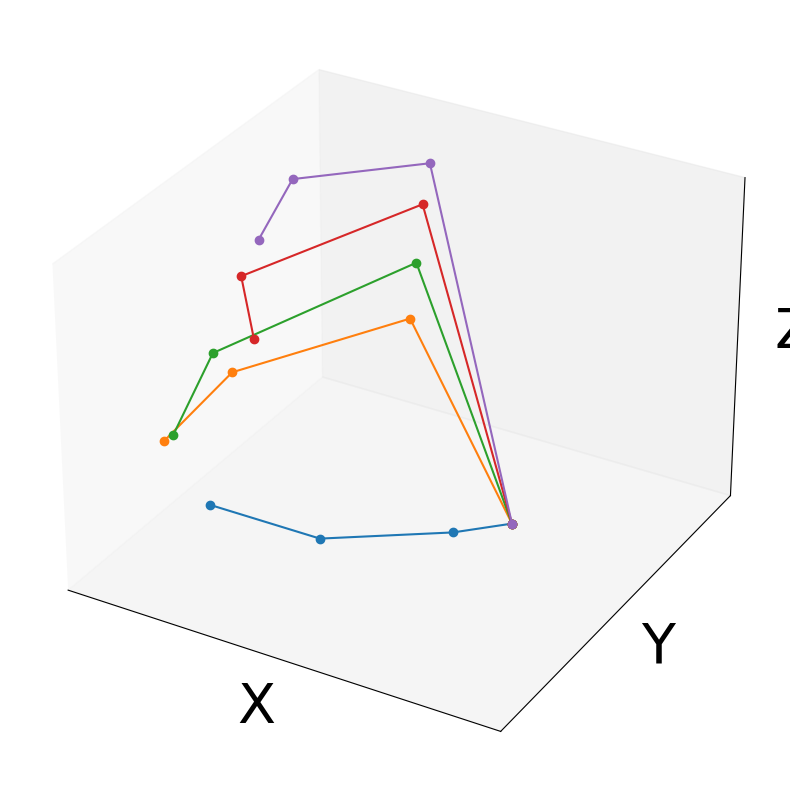

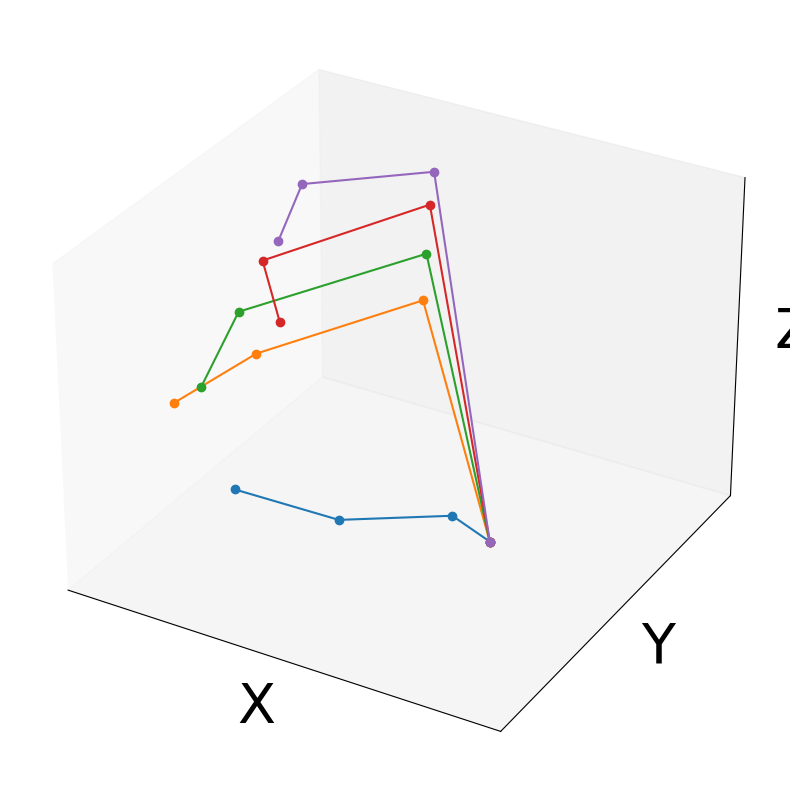

...

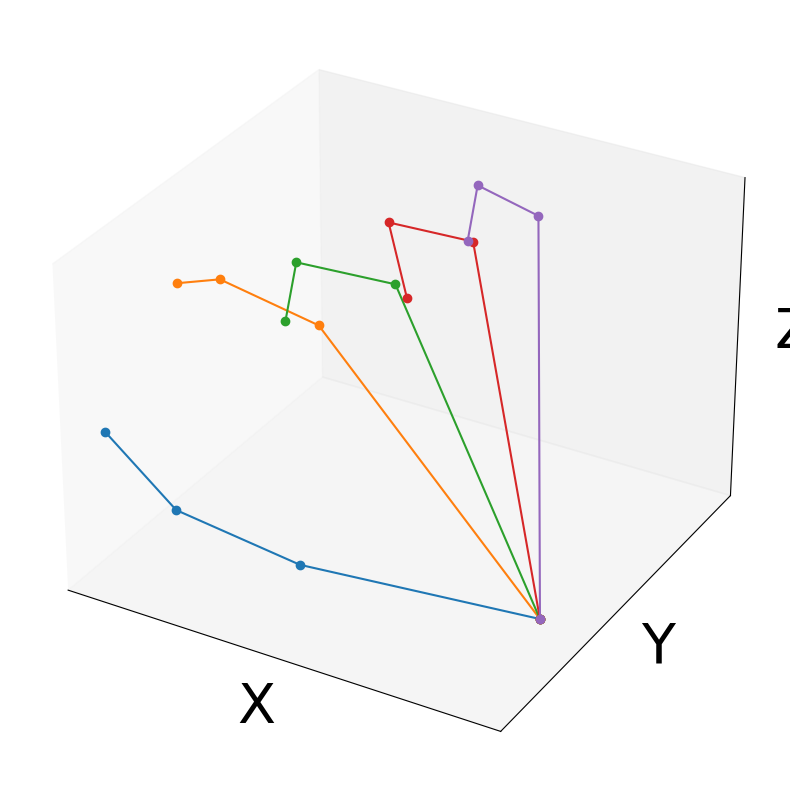

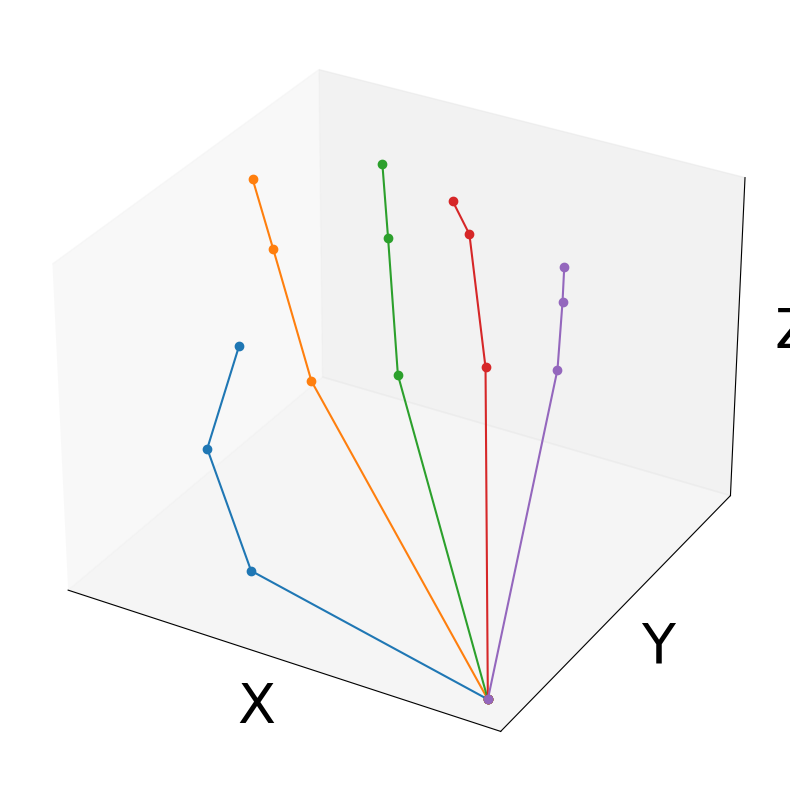

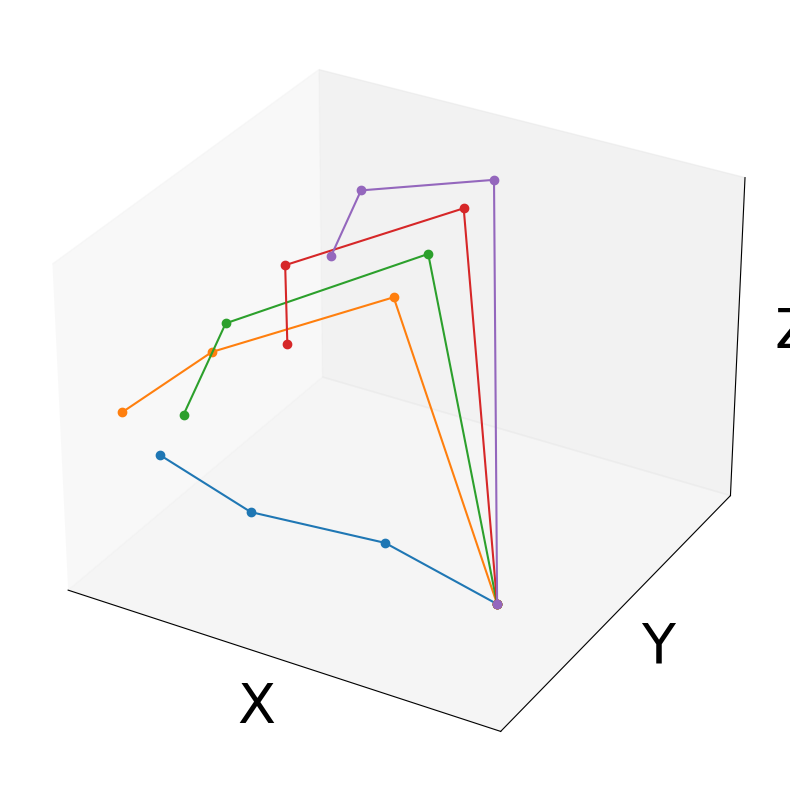

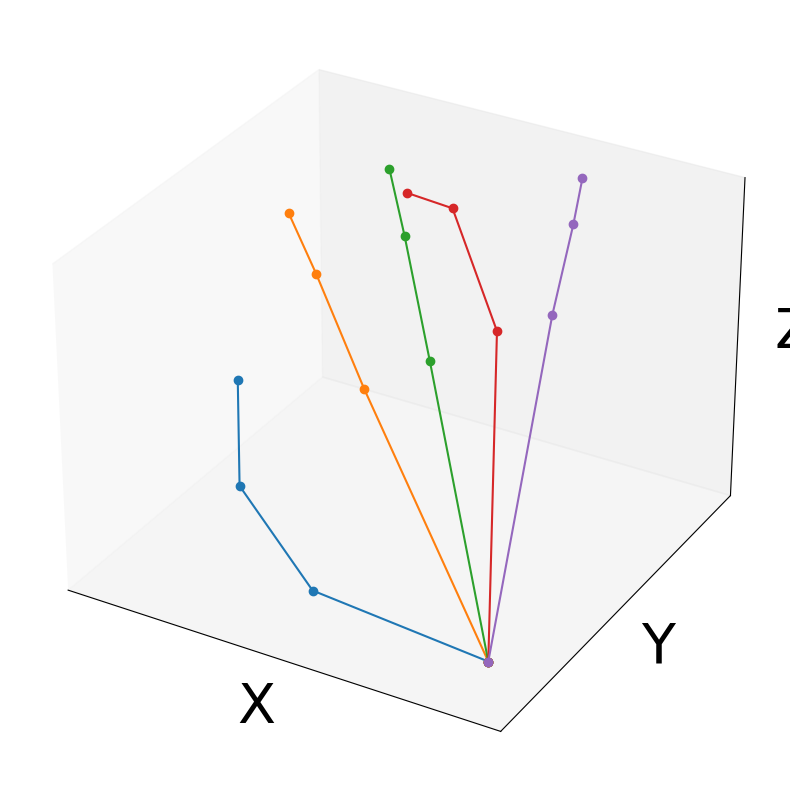

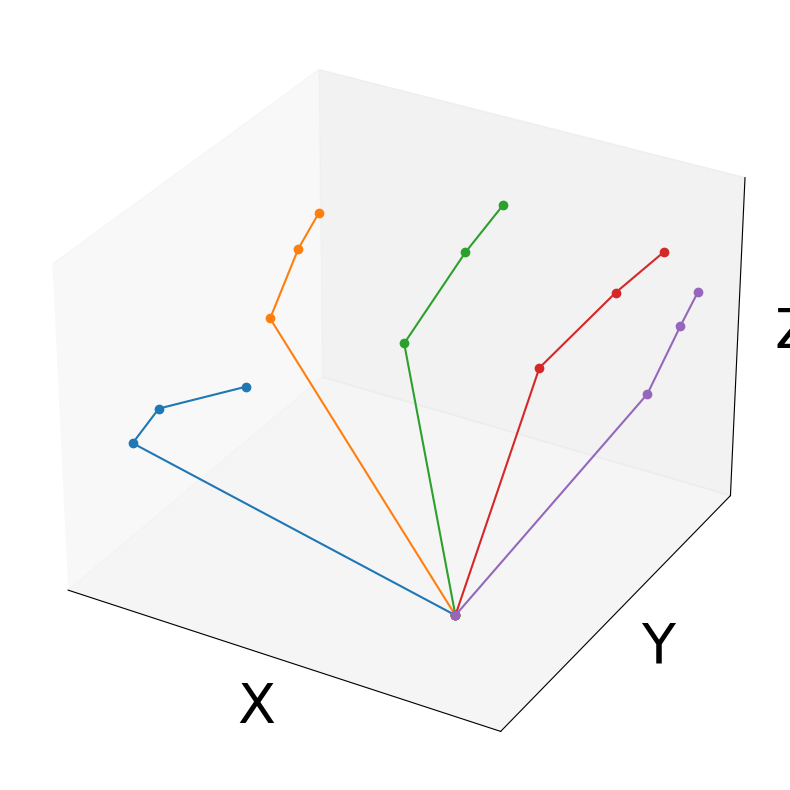

In [41]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import numpy as np
import random
import os 


# Define the folder to save the images
save_folder = "image_classifier"

# Check if the folder exists, if not, create it
if not os.path.exists(save_folder):
    os.makedirs(save_folder)

path = "/home/phd-leonardo-sitl/Desktop/PhdLeo/dataset_glove/predictions/"

def extracting_pos(df, landmark_positions, index):
    for i in range(1, 22):
        landmark_positions.append([df[f"transform{i}.translation.x"].values[index], 
                                   df[f"transform{i}.translation.y"].values[index],
                                   df[f"transform{i}.translation.z"].values[index]])

def plotting(landmark_positions, index):
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection="3d")
    
    # Set axis labels
    ax.set_xlabel("X",fontsize=40)
    ax.set_ylabel("Y",fontsize=40)
    ax.set_zlabel("Z",fontsize=40)
    

    fingers = [[0, 1, 2, 3], [0, 5, 6, 7], [0, 9, 10, 11], [0, 13, 14, 15], [0, 17, 18, 19]]
    
    for finger in fingers:
        finger_landmarks = np.array(landmark_positions)[finger]
        ax.plot(finger_landmarks[:, 0], finger_landmarks[:, 1], finger_landmarks[:, 2], marker='o')
        # Turn off axis labels
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_zticks([])
        ax.grid(False)
    
    # Add legend and title
        #3D Positions of Landmarks - 
    # ax.set_title(f"Prediction: {y_pred[index]}",fontsize=50)
    plt.gcf().set_facecolor('white')
    plt.savefig(f"{path}plot_{index}.pdf")
    plt.pause(0.001)  # Pause for visualization


# Get the total number of samples
total_samples = len(df_test)

# Select 10 random indices
random_indices = random.sample(range(total_samples), 20)

for i in random_indices:
    landmark_positions = []
    extracting_pos(df_test, landmark_positions, i)
    plotting(landmark_positions, i)
    plt.show()  # Display the plot before saving
